<a href="https://colab.research.google.com/github/RozenkovAndrey/projects_of_yandex_practicum/blob/main/Moscow%20catering/Moscow_catering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Описание проекта

На основании данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года, необходимо проанализировать ситуацию на рынке общественного питания г. Москвы. Исследование поможет определиться с категорией будущего заведения, количеством посадочных мест, средним чеком и районом расположения. Основные выводы исследования необходимо оформить в виде презентации для демонстрации группе инвесторов.

- Описание данных

Файл moscow_places.csv:

name — название заведения;

address — адрес заведения;

category — категория заведения, например «кафе», «пиццерия» или «кофейня»;

hours — информация о днях и часах работы;

lat — широта географической точки, в которой находится заведение;

lng — долгота географической точки, в которой находится заведение;

rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;

«Цена чашки капучино: 130–220 ₽»;

«Цена бокала пива: 400–600 ₽».

и так далее;

middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

0 — заведение не является сетевым

1 — заведение является сетевым

district — административный район, в котором находится заведение, например Центральный административный округ;

seats — количество посадочных мест.

# Шаг 1 Обзор и предобработка данных

- Загрузите данные и изучите общую информацию Загрузите данные о заведениях общественного питания Москвы.

- Изучите общую информацию о датасете. Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят?

In [159]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy
import scipy.stats as stats
import seaborn as sns
import sklearn.linear_model as lm
import statsmodels.api as sm
import statsmodels.formula.api as smf
import plotly.express as px
from plotly.subplots import make_subplots
from folium import Map, Choropleth
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
import warnings
from plotly import graph_objects as go
warnings.simplefilter("ignore")
plt.style.use('classic')

In [160]:
# Импортирую библиотеку определния расстояния от центра до заведения
try:
  import geopy.distance
except:
  !pip install geopy
  import geopy.distance

In [161]:
from pandasql import sqldf

In [162]:
# # Импортирую библиотеку для работы с функциями SQL
# try:
#   from pandasql import sqldf
# except:
#   !pip install pandasql
#   from pandasql import sqldf

In [163]:
#Читаю файл с данными
try:
 df = pd.read_csv('/datasets/moscow_places.csv')
except:
 df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [164]:
# обзор данных
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


#Шаг 2
Выполните предобработку данных Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

Выполните предобработку данных: Создайте столбец street с названиями улиц из столбца с адресом.

In [165]:
# Вставляю функцию для обзора данных
def info_data(df):
    print('Форматы данных, заполнение столбцов и количество строк')   
    display(df.info())
    print('')
    print('')
    print('Количество строк и столбцов')
    display(df.shape)
    print('')
    print('')
    print('Пропуски в датасете')  
    display(df.isnull().sum())    # содержание нулевых значений в датасете
    print('')
    print('')
    print('Количество дубликатов:')
    display(df.duplicated().sum()) # проверка на наличие дубликатов

In [166]:
# обзор данных
info_data(df)

Форматы данных, заполнение столбцов и количество строк
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None



Количество строк и столбцов


(8406, 14)



Пропуски в датасете


name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64



Количество дубликатов:


0

In [167]:
a = df.name.nunique()
print('Представлено количество названий заведений:', a)

Представлено количество названий заведений: 5614


**Вывод:** При знакомстве с данными дубликатов не обнаружено, есть столбцы с пропусками, например, с ценой, поскольку ситуация может менятся или просто нет точных данных. Также есть пропуски в столбце с графиком работы некоторых заведений. Типы данных в столбцах соответствуют. Представлено 8406 заведений.

In [168]:
# Добавляю столбец с индексами для дальнейших группировок данных
df['index'] = df.index

In [169]:
# Боремся с неявными дубликатами заведений - приводим значения к верхнему регистру, убираем крайние пробелы
df['name'] = df['name'].str.lower()
df['name'] = df['name'].str.strip()

In [170]:
# Вывожу названия 100 самых популярных заведений и их количество, нахожу не явные дубликаты в названиях
pd.set_option('display.max_rows', None)
df.groupby('name').agg({'index': 'nunique'}).sort_values(by='index', ascending=False).head(100)

,index
name,
кафе,189
шоколадница,120
домино'с пицца,77
додо пицца,74
one price coffee,72
яндекс лавка,69
cofix,65
prime,50
хинкальная,44


**Вывод:** Видим неявные дубликаты - чайхана и чайхона. Но в таджикском и узбекском языках принято написание «чойхона», а в азербайджанском и туркменском это слово пишут через «а» — «чайхана». Несмотря на это, в русском языке давно закрепилось только одно нормативное написание — «чайхана», всё через «а». Но бояться вывесок «чайхона» в больших городах не стоит, возможно, хозяин предприятия – узбек или таджик, а заведение связано с узбекской или таджикской кухней.
Источник: https://kakpishem.ru/pishem-pravilno-slova/chayhana-ili-chayhona.html

В данном случае мы не знаем, закралась ли ошибка при заполнении данных или заведения действительно по-разному называются, поэтому переименовывать не явные дубликаты не будем.

In [171]:
#Добавляю столбец с улицами и привожу улицы к нижнему регистру
#df['street'] = df.address.apply(lambda x: x.split()[1:])
df['street']=[x.split(',')[1] for x in df['address'].values]
df['street'] = df.street.apply(lambda x: x.lower())

In [172]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,index,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,0,улица дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,1,улица дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,2,клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,3,улица маршала федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,4,правобережная улица


- Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):логическое значение True — если заведение работает ежедневно и круглосуточно; логическое значение False — в противоположном случае.

In [173]:
# Создаю столбец is_24/7
df['is_24/7'] = np.where((df['hours'].str.contains("ежедневно, круглосуточно") == True),True, False)

In [174]:
df['is_24/7'].sum()

730

#Шаг 3. Анализ данных

- Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [175]:
# Вывожу количество заведений и их процент от общего количества
df5 = df.category.value_counts(ascending = False).reset_index()
df5 = df5.rename (columns= {'index': 'name_category', 'category': 'cnt'})

df5['percent'] = (df5['cnt'] / sum(df5['cnt']) * 100).round(2)
df5

,name_category,cnt,percent
0,кафе,2378,28.29
1,ресторан,2043,24.30
2,кофейня,1413,16.81
3,"бар,паб",765,9.10
4,пиццерия,633,7.53
5,быстрое питание,603,7.17
6,столовая,315,3.75
7,булочная,256,3.05


In [176]:
# Пишу функцию для столбчатых диаграмм
def hist(data, name_x,name_y,name_title, name_title2, name_xaxis_title, name_yaxis_title):
  # строим столбчатую диаграмму 
  fig = px.bar(data, # загружаем данные и заново их сортируем
              x= name_x, # указываем столбец с данными для оси X
              y= name_y, # указываем столбец с данными для оси Y
              text= name_title # добавляем аргумент, который отобразит текст с информацией
                                  # о количестве объявлений внутри столбца графика
              )
  # оформляем график
  fig.update_layout(title=name_title2,
                    xaxis_title=name_xaxis_title,
                    yaxis_title=name_yaxis_title)
  fig.show() # выводим график

In [177]:
# Строю диаграмму количество объектов общественного питания по категориям
hist(df5,
     'cnt',
     'name_category' ,
     'cnt',
     'Количество объектов общественного питания по категориям',
     'Количество заведений',
     'Категория')

<div class="alert alert-block alert-success">
    
<b>Комментарий ревьюера:</b> Хорошо, что все столбцы на графике одного цвета: так заказчика не будет отвлекать лишняя информация.
</div>

In [178]:
# Строю диаграмму для долей объектов общественного питания по категориям
hist(df5,
     'percent',
     'name_category' ,
     'percent',
     'Доля объектов общественного питания по категориям',
     'Доля заведения от общего количествва',
     'Категория')

**Вывод:** Как мы видим, подавляющее количество заведений - кафе (около 28% или 2378 штук).
Далее идут рестораны и кофейни (24,3% и 16,8% соответсвенно). Меньше всего булочных и столовых(3,05% и 3,75% соответственно).

- Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [179]:
# Вывожу датасет с запоненными значениями в столбце с количеством посадочных мест
df6 = df[df.seats.isna() == False]
df6.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,index,street,is_24/7
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,1,улица дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,2,клязьминская улица,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,4,правобережная улица,False
6,огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,6,клязьминская улица,False
7,mr. уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,7,клязьминская улица,False


In [180]:
# Вывожу таблицу с медианным количеством посаочных мест и суммарным по категориям
df6 = df6.groupby('category', as_index=False).agg({'seats':[np.median, np.sum]})
df6.columns = df6.columns.map(''.join)
df6 = df6.sort_values(by = 'seatssum', ascending=False)
df6['seatsmedian'] = df6['seatsmedian'].round()
df6

,category,seatsmedian,seatssum
6,ресторан,86.0,154869.0
3,кафе,60.0,118770.0
4,кофейня,80.0,83511.0
0,"бар,паб",82.0,58281.0
5,пиццерия,55.0,40350.0
2,быстрое питание,65.0,34513.0
7,столовая,76.0,16359.0
1,булочная,50.0,13229.0


In [181]:
# Строю диаграмму для общего количества посадочных мест по категориям
hist(df6,
     'seatssum',
     'category' ,
     'seatssum',
     'Общее количество посадочных мест по категориям',
     'Количество посадочных мест',
     'Категория')

In [182]:
# Строю диаграмму для медианного количества посадочных мест по категориям
df6 = df6.sort_values(by = 'seatsmedian', ascending=False)
hist(df6,
     'seatsmedian',
     'category' ,
     'seatsmedian',
     'Медианное количество посадочных мест по категориям',
     'Количество посадочных мест',
     'Категория')

In [183]:
# Вывожу общую инфомацию по посаочным местам
df6.describe()

,seatsmedian,seatssum
count,8.000000,8.000000
mean,69.250000,64985.250000
std,13.530389,50622.853949
min,50.000000,13229.000000
25%,58.750000,29974.500000
50%,70.500000,49315.500000
75%,80.500000,92325.750000
max,86.000000,154869.000000


In [184]:
# Вывожу заведения с нулевым количеством посадочных мест
df6[df.seats == 0].head()

,category,seatsmedian,seatssum


**Вывод:** Количество посадочных мест варьируются от 0 до 1288.
Наибольшее медианное значение посадочных мест в ресторанах (86), наименьшее - 0, полагаю это может быть связано с доставкой еды на дом или наличием заведений с быстрой едой, где нет посадочных мест.

Наибольшее суммарное количество посадочных мест в ресторанах и кафе (154869 и 118770 соответвенно), наименьшее - в булочных и столовых. (13229 и 16359 соответственно).

- Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше? Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком. Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [185]:
# Строю таблицу с количеством сетевых и не сетевых заведений по категориям
data_ed1 = df.groupby(['category', 'chain'], \
                        as_index = False)[['chain']].count()

In [186]:
data_ed1['debt'] = [0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1]
data_ed1

,category,chain,debt
0,"бар,паб",596,0
1,"бар,паб",169,1
2,булочная,99,0
3,булочная,157,1
4,быстрое питание,371,0
5,быстрое питание,232,1
6,кафе,1599,0
7,кафе,779,1
8,кофейня,693,0
9,кофейня,720,1


In [187]:
import sqlite3 as sl

In [188]:
con = sl.connect('my-test.db')

In [189]:
data_ed1.head()

,category,chain,debt
0,"бар,паб",596,0
1,"бар,паб",169,1
2,булочная,99,0
3,булочная,157,1
4,быстрое питание,371,0


In [190]:
data_ed1.to_sql('data_ed1', con, if_exists='append')

16

In [191]:
dfn1 = pd.read_sql('''
    SELECT category,	link,	not_link,	total, ROUND(ratio_link,2) AS ratio_link, ROUND(ratio_not_link,2) AS ratio_not_link
 FROM
(SELECT *, 
(CAST(link AS real)*100/total) AS ratio_link,
(CAST(not_link AS real)*100/total) AS ratio_not_link
FROM
(SELECT category, chain as link, prev AS not_link, (chain+prev) AS total
FROM
(SELECT category, chain, LAG(chain) OVER (partition by category) AS prev
FROM data_ed1) AS t1
WHERE prev IS NOT NULL) AS t2) AS t3
ORDER BY ratio_link
''', con)
dfn1

,category,link,not_link,total,ratio_link,ratio_not_link
0,"бар,паб",169,596,765,22.09,77.91
1,"бар,паб",169,596,765,22.09,77.91
2,"бар,паб",169,596,765,22.09,77.91
3,столовая,88,227,315,27.94,72.06
4,столовая,88,227,315,27.94,72.06
5,столовая,88,227,315,27.94,72.06
6,кафе,779,1599,2378,32.76,67.24
7,кафе,779,1599,2378,32.76,67.24
8,кафе,779,1599,2378,32.76,67.24
9,ресторан,730,1313,2043,35.73,64.27


In [192]:
# Строю диаграмму доли сетевых заведений от общего количества
hist(dfn1,
     'ratio_link',
     'category' ,
     'ratio_link',
     'Доля сетевых заведений по категориям',
     '% от общего количества заведений',
     'Категория')

In [193]:
# Строю диаграмму доли НЕ сетевых заведений от общего количества
hist(dfn1,
     'ratio_not_link',
     'category' ,
     'ratio_not_link',
     'Доля НЕ сетевых заведений по категориям',
     '% от общего количества заведений',
     'Категория')

,chain,count
0,0,5201
1,1,3205


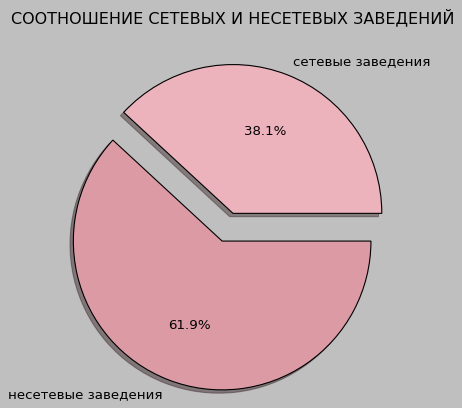

In [194]:
# Строю таблицу и вывожу соотношение сетевых и не сетевых заведений

df123 = df.groupby('chain').agg(count=('index','count')).reset_index()
display(df123)

plt.figure(figsize=(6, 6))
colors = ['#DC9AA5', '#EDB3BD']
#labels = ['US', 'UK', 'India', 'Germany', 'Australia', 'South Korea']
explode = (0.2, 0)
plt.pie(df123['count'],
        labels=df123['chain'].map({1: 'сетевые заведения', 0: 'несетевые заведения'}), 
        colors=colors,
        explode=explode, 
        autopct='%1.1f%%',
        counterclock=False, 
        shadow=True)
plt.title('СООТНОШЕНИЕ СЕТЕВЫХ И НЕСЕТЕВЫХ ЗАВЕДЕНИЙ')
plt.show()

**Вывод:** 

Более 60% объектов общественного питания - несетевые. 

В разрезе по категориям больше всего сетевых заведений - это булочные 61,33% из всех булочных, пиццерии 52,13% и кофейни 50,96%.

Меньше всего сетеых заведений в сегментах бары 22.09%	и столовые 27.94%.



- Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [195]:
# Делаю фильтрацию  датасета по  сетевым заведениям, вывожу сгруппированную таблицу с названием сети и количеством заведений
df7 = df[df.chain == 1]
df8 = df7.groupby(['name', 'category'], as_index = False)[('index')].count().sort_values(by = 'index', ascending = False).head(15)
df8

,name,category,index
1126,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1142,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
617,кофепорт,кофейня,42
632,кулинарная лавка братьев караваевых,кафе,39
963,теремок,ресторан,36


In [196]:
# Делаю сводную таблицу сети заведений по округам
sp7 = list(df8.name)
df32 = df7[df7.name.isin(sp7) == True]  
#df32.groupby(['name', 'district'])[('name')].count().sort_values(ascending = False).to_frame()

test10 = (df32.pivot_table(
    index='name', 
    columns= 'district', 
    values='index',
    aggfunc='count'))
test10

district,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ
name,,,,,,,,,
cofefest,4.0,3.0,4.0,4.0,1.0,5.0,3.0,5.0,3.0
cofix,6.0,4.0,10.0,6.0,4.0,20.0,4.0,2.0,9.0
drive café,NaN,8.0,3.0,NaN,1.0,1.0,2.0,5.0,4.0
one price coffee,6.0,9.0,8.0,7.0,4.0,15.0,6.0,7.0,9.0
prime,1.0,3.0,3.0,1.0,1.0,37.0,NaN,2.0,2.0
буханка,2.0,7.0,9.0,8.0,3.0,1.0,NaN,2.0,NaN
додо пицца,11.0,6.0,10.0,10.0,6.0,5.0,6.0,8.0,12.0
домино'с пицца,9.0,9.0,10.0,9.0,7.0,3.0,10.0,8.0,11.0
кофемания,NaN,4.0,3.0,NaN,NaN,15.0,NaN,1.0,NaN


**Вывод:** Чем больше сеть, тем больше филиалов в центре, чем меньше, тем больше не в центральном районе.

In [197]:
# Вывожу таблицу с режимом работы сетей топ-15 по количеству заведений
df7.groupby(['name', 'hours'])[('name')].count().sort_values(ascending = False).head(15).to_frame()

,,name
name,hours,
яндекс лавка,"ежедневно, 07:00–00:00",44
кулинарная лавка братьев караваевых,"ежедневно, 08:00–23:00",39
кофепорт,пн-пт 08:00–18:30,28
cofefest,пн-пт 08:00–19:00,25
шоколадница,"ежедневно, 10:00–22:00",25
drive café,"ежедневно, круглосуточно",24
додо пицца,"ежедневно, 09:00–23:00",21
one price coffee,"ежедневно, 10:00–22:00",20
french bakery,пн-пт 07:30–23:00; сб 08:00–22:00; вс 09:00–21:00,19


**Вывод:** Между сетями общее то, что почти все работают без выходных.

In [198]:
hist(df8,
     'index',
     'name' ,
     'index',
     'Топ 15 сетей в Москве по количеству заведений',
     'Количество заведений',
     'Категория')

**Вывод:** Наибольшее количество заведений у шоколадницы - 119, наименьшее - у кофемании - 22 из топ-15 по количеству заведений.

- Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [199]:
# Вывожу таблицу с количеством заведений по округам
df.groupby(['district'])[('name')].count().sort_values(ascending = False).to_frame()

,name
district,
Центральный административный округ,2242
Северный административный округ,900
Южный административный округ,892
Северо-Восточный административный округ,891
Западный административный округ,851
Восточный административный округ,798
Юго-Восточный административный округ,714
Юго-Западный административный округ,709
Северо-Западный административный округ,409


In [200]:
# Делаю сводную таблицу количества заведений по округам и категориям
test2 = (df.pivot_table(
    index='category', 
    columns= 'district', 
    values='name',
    aggfunc='count'))

test2 = test2.T
test2['sum'] = test2.sum(axis = 1)
test2 = test2.sort_values(by = 'sum', ascending = False, axis = 0)
test2 = test2.drop('sum', axis=1)
test2

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Центральный административный округ,364,50,87,464,428,113,670,66
Северный административный округ,68,39,58,235,193,77,189,41
Южный административный округ,68,25,85,264,131,73,202,44
Северо-Восточный административный округ,63,28,82,269,159,68,182,40
Западный административный округ,50,37,62,239,150,71,218,24
Восточный административный округ,53,25,71,272,105,72,160,40
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Северо-Западный административный округ,23,12,30,115,62,40,109,18


In [201]:
# Отображаю количество заведений по округам и категориям на диаграмме

fig = px.bar(test2, title = "Распределение количества категорий заведений по округам", text="value")
fig.show()

**Вывод:** В центральном округе больше всего заведений из всех категорий.

- Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [202]:
# Вывожу таблицу со средним рейтингом заведений по категориям
df10 = df.groupby(['category'])[('rating')].mean().sort_values(ascending = False).to_frame().reset_index()
df10.rating = df10.rating.round(2)
df10

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [203]:
# Пишу функцию для столбчатых диаграмм
def hist2(data, name_x,name_y,name_title, name_title2, name_xaxis_title, name_yaxis_title):
  # строим столбчатую диаграмму 
  fig = px.bar(data, # загружаем данные и заново их сортируем
              x= name_x, # указываем столбец с данными для оси X
              y= name_y, # указываем столбец с данными для оси Y
              text= name_title # добавляем аргумент, который отобразит текст с информацией
                                  # о количестве объявлений внутри столбца графика
              )
  
  # оформляем график
  fig.update_layout(title=name_title2,
                    xaxis_title=name_xaxis_title,
                    yaxis_title=name_yaxis_title
                    )
  fig.update_xaxes(range=[3.5, 4.5])
  fig.show() # выводим график

In [204]:
# Визуализирую средний рейтинг заведений по категориям
hist2(df10,
     'rating',
     'category' ,
     'rating',
     'Средний рейтинг заведений по категориям',
     'Средний рейтинг',
     'Категория')

**Вывод:** У баров и пабов средний рейтинг выше, чем у остальных категорий, возможно, туда ходят люди не для того, чтобы оценить заведение само заведение.

- Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

In [205]:
#  Вывожу таблицу со средним рейтингом заведений по округам
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
rating_df.rating = rating_df.rating.round(2)
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


**Вывод:** Средний рейтинг заведений выше в центральном районе, здесь гуляет много туристов и нахоится правительсто, больше инвестиций.

In [206]:
!gdown --id 1imyBCjBpZ9y2F52EPSE2D8H1h8pDUlj7

/usr/local/lib/python3.9/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1imyBCjBpZ9y2F52EPSE2D8H1h8pDUlj7
To: /content/admin_level_geomap.geojson
100% 382k/382k [00:00<00:00, 113MB/s]


In [208]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/content/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

- Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [209]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

**Вывод:** Больше всего заведений в центральном районе.

- Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [210]:
# Вывожу таблицу с топ-15 улицами по количеству заведений и количеством уникальных категорий
df11 = df.groupby('street', as_index=False)['name', 'category'].agg({'name':'count', 'category':'nunique'}).sort_values(by = 'name', ascending = False).head(15)
df11

,street,name,category
837,проспект мира,184,8
841,профсоюзная улица,122,8
834,проспект вернадского,108,8
533,ленинский проспект,107,8
531,ленинградский проспект,95,8
379,дмитровское шоссе,88,8
461,каширское шоссе,77,7
304,варшавское шоссе,76,7
532,ленинградское шоссе,70,8
610,мкад,65,6


In [211]:
# Строю диаграмму топ-15 улиц по количеству заведений
hist(df11,
     'name',
     'street' ,
     'name',
     'Топ-15 улиц по количеству заведений',
     'Количество заведений',
     'Наименование улицы')

<div class="alert alert-block alert-success">
<b>Комментарий ревьюера:</b> Ты правильно выделяешь Топ-15 улиц.
    
</div>

**Вывод:** Проспект мира лидирует по числу заведений, это большая улица с достопримечательностями и ВДНХ.

In [212]:
# Нахожу общее количество заведений на топ-15 улиц
sp1 = list(df11.street)
df12 = df[df.street.isin(sp1) == True]
len(df12)

1258

In [213]:
# Делаю сводную таблицу по наименованию улиц и категориям заведений
test4 = (df12.pivot_table(
    index='street', 
    columns= 'category', 
    values='name',
    aggfunc='count'))

In [214]:
test4['sum'] = test4.sum(axis = 1)
test4 = test4.sort_values(by = 'sum', ascending = False, axis = 0)
test4 = test4.drop('sum', axis=1)
test4 = test4.fillna(0)
test4

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
проспект мира,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
проспект вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0
варшавское шоссе,6.0,0.0,7.0,18.0,14.0,4.0,20.0,7.0
ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0


In [215]:
# Визуализирую количество заведений по наименованию улиц и категориям заведений на диаграмме
fig = px.bar(test4, title = "Распределение количество заведений по топ-15 улицам и категориям заведений", text="value")
fig.show()

In [216]:
 # Визуализирую количество заведений по наименованию улиц и категориям заведений на графике
fig = px.line(test4, title = "Распределение количество заведений по топ-15 улицам и категориям заведений")
fig.show()

In [217]:
# Визуализирую количество заведений по наименованию улиц и категориям заведений ещё раз
import plotly.express as px

fig = px.sunburst(data_frame=df12, path=['category', 'street'])
fig.update_layout(autosize=False, width=1000, height=1000, showlegend=True)
fig.show()

**Вывод:**
- По количеству кафе, ресторанов, кофейен, быстрому питанию лидирует проспект Мира.

- Больше всего пиццерий на улице Профсоюзной.

- По столовым равенство на Леннградском проспекте и Каширском шоссе.

- Больше всего пабов на Ленинградском шоссе.
- По булочным равенство на Ленинградском шоссе, Профсоюзной улице и Проспекте мира.

- Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [218]:
# Вывожу улицы, где находится только один объект общепита
df13 = df.groupby(['street'], as_index=False)['name'].agg({'name':'count'}).sort_values(by = 'name', ascending = False)
df13 = df13[df13.name == 1]
df13 =  df13.reset_index()
df13.head()

,index,street,name
0,1148,улица капотня,1
1,1256,улица острякова,1
2,1343,улица фотиевой,1
3,1437,якиманский переулок,1
4,1230,улица мжд киевское 5-й км,1


In [219]:
# Вывожу таблицу с категориями заведений и их количеством на улицах с одни заведением
sp5 = list(df13.index)
dfn = df[df.index.isin(sp5)]
dfn
dfn.groupby('category', as_index=False)['name'].count().sort_values(by = 'name', ascending = False)

,category,name
3,кафе,132
6,ресторан,105
4,кофейня,65
5,пиццерия,45
2,быстрое питание,42
0,"бар,паб",37
1,булочная,20
7,столовая,11


**Вывод:** Больше на улицах с одним заведением кафе, ресторанов и кофеен.

<div class="alert alert-block alert-success">
<b>Комментарий ревьюера:</b> Теперь у нас есть примерное представление об этих заведениях.
    
</div>

- Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района.

In [220]:
# Вывожу таблицу с медианными средними чеками по округам
df14 = df.groupby('district', as_index=False)['middle_avg_bill'].median().sort_values(by = 'middle_avg_bill', ascending = False)
df14

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


**Вывод:** Самые высокие средние чеки по медианному значению в центральном и западном округах - 1000 руб.

- Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района.

In [221]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/content/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df14,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианное значение среднего чека по округам',
).add_to(m)

# выводим карту
m

<div class="alert alert-block alert-success">
<b>Комментарий ревьюера:</b> Все верно. В столбце со средним чеком есть выбросы, поэтому мы считаем по медиане.
    
</div>

- Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [222]:
# Вычисляю и создаю столбец с расстоянием от заведения до центра
list1 = list(df['lat'])
list2 = list(df['lng'])



sp2 = []
for (i,j) in zip(list1,list2):
  coords_1 = (i, j)
  coords_2 = (55.751244, 37.618423)
  sp2.append(geopy.distance.geodesic(coords_1, coords_2).km)
len(sp2)

8406

In [223]:
df['distance'] = sp2

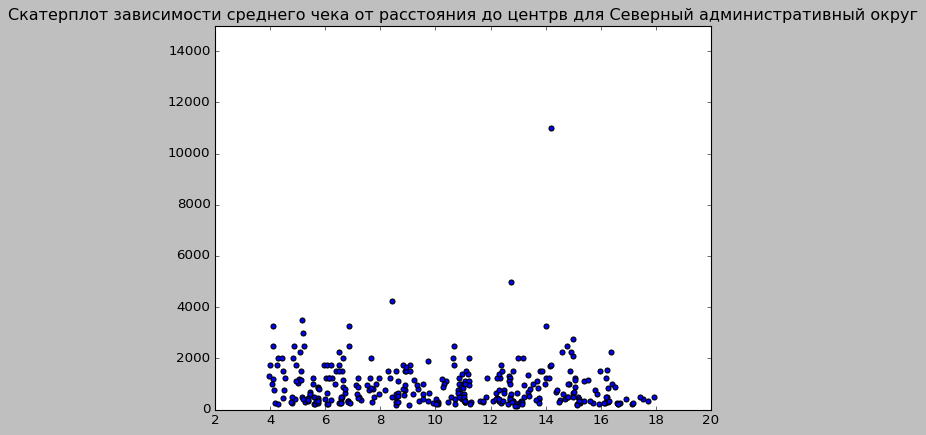

Коэфициент корреляции между растоянием до центра и средним чеком для Северный административный округ
-0.09127574867082343


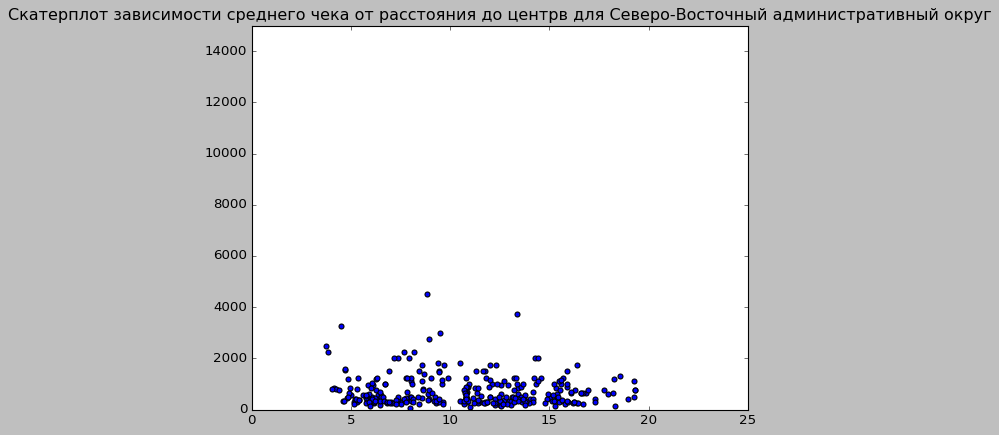

Коэфициент корреляции между растоянием до центра и средним чеком для Северо-Восточный административный округ
-0.0810748098108812


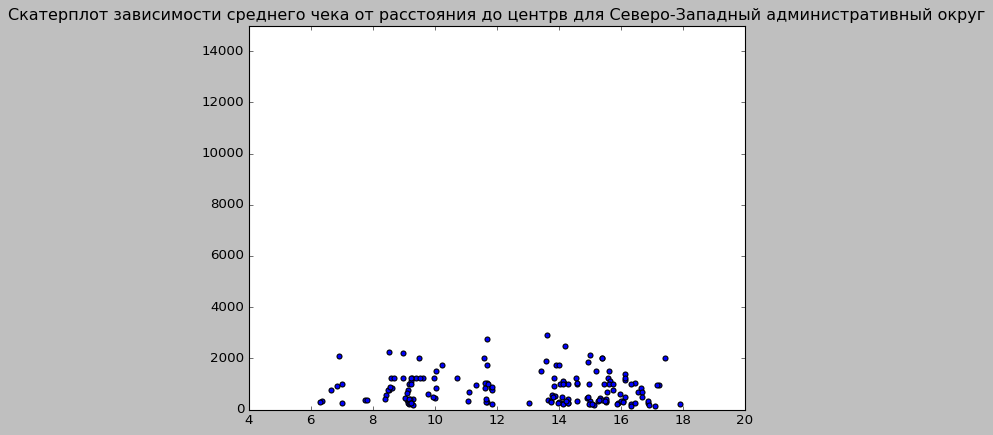

Коэфициент корреляции между растоянием до центра и средним чеком для Северо-Западный административный округ
-0.078316977385163


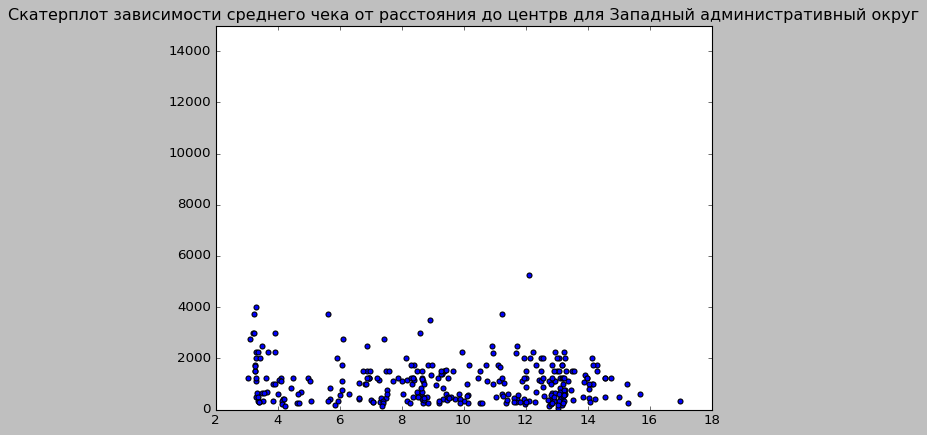

Коэфициент корреляции между растоянием до центра и средним чеком для Западный административный округ
-0.13720641086620927


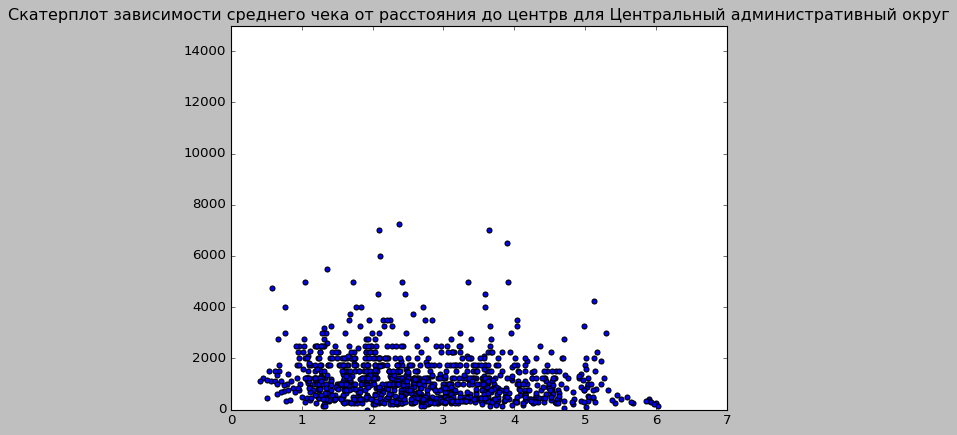

Коэфициент корреляции между растоянием до центра и средним чеком для Центральный административный округ
-0.16878449136726503


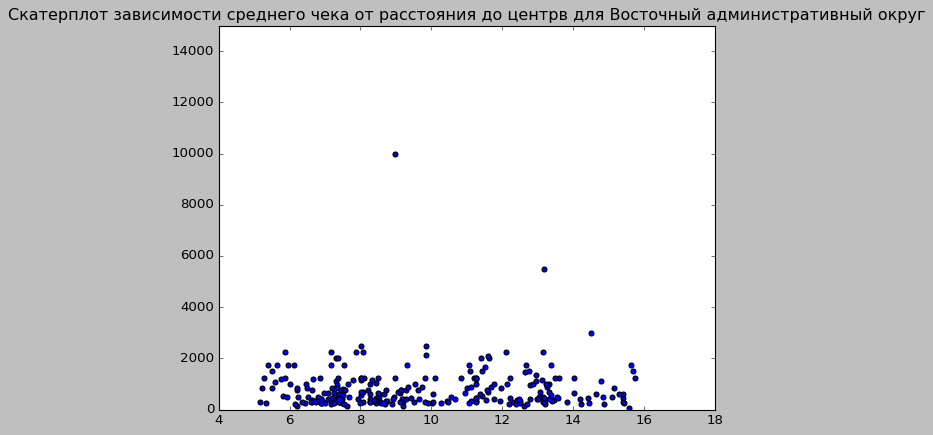

Коэфициент корреляции между растоянием до центра и средним чеком для Восточный административный округ
0.017628938994657967


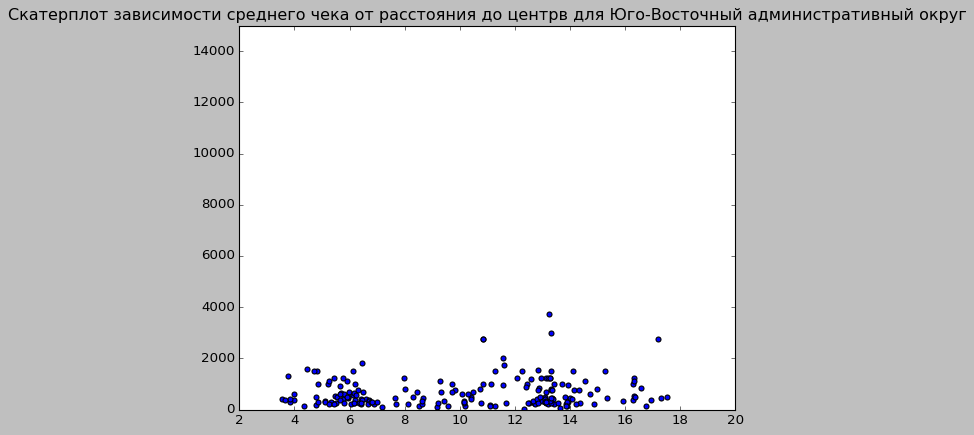

Коэфициент корреляции между растоянием до центра и средним чеком для Юго-Восточный административный округ
0.11565683659608542


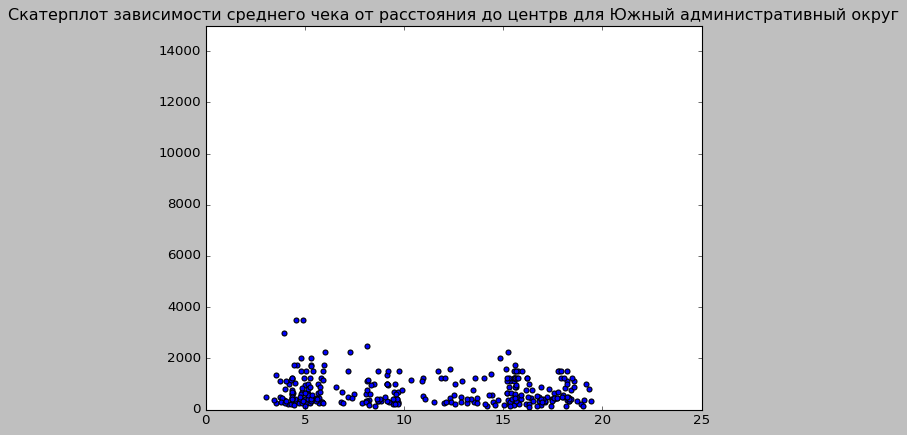

Коэфициент корреляции между растоянием до центра и средним чеком для Южный административный округ
-0.02435463283999682


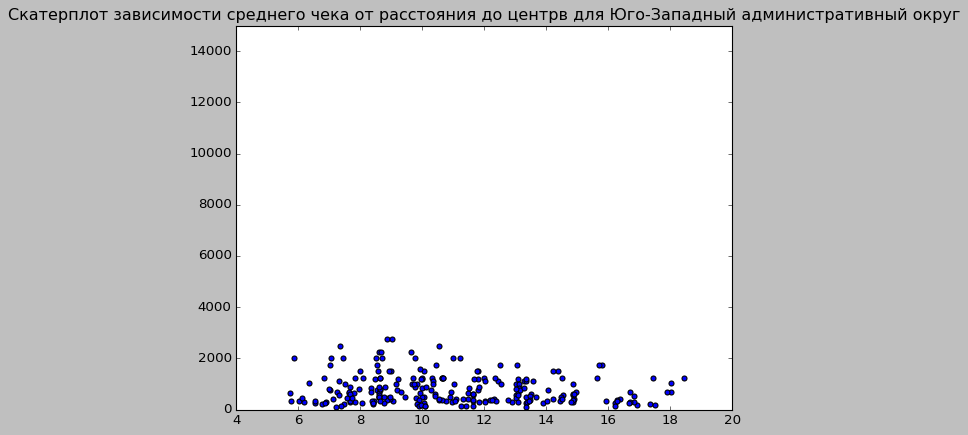

Коэфициент корреляции между растоянием до центра и средним чеком для Юго-Западный административный округ
-0.13588965697729669


In [224]:
# Строю скатерплот для визуализации зависимости среднего ческа в заведениях от удалённости от центра
for i in list(df.district.unique()):
    df15 = df[df.district == i]
    plt.title(f'Скатерплот зависимости среднего чека от расстояния до центрв для {i}')
    plt.scatter(df15.distance, df15.middle_avg_bill)
    plt.ylim(0, 15000)
    plt.show()
    print('Коэфициент корреляции между растоянием до центра и средним чеком для', i)
    print(df15['distance'].corr(df15['middle_avg_bill']))
#print(df.district.unique())

**Вывод:** Влияние удалённости от центра заведения на средний чек незначительно, скорее будут влиять другие факторы, например, квалификация поваров или мишленовские звёзды. 

- Соберите наблюдения по вопросам выше в один общий вывод.

**Промежуточные выводы по 3-ему шагу:**
- Подавляющее количество заведений - кафе (около 28% или 2378 штук). Далее идут рестораны и кофейни (24,3% и 16,8% - соответственно). Меньше всего булочных и столовых (3,05% и 3,75% соответственно).
- Количество посадочных мест варьируются от 0 до 1288. Наибольшее медианное значение посадочных мест в ресторанах (86), наименьшее - 0, это может быть связано с доставкой еды на дом или наличием заведений с быстрой едой, где нет посадочных мест.
Наибольшее суммарное количество посадочных мест в ресторанах и кафе (154869 и 118770 соответвенно), наименьшее - в булочных и столовых. (13229 и 16359 соответственно).
- Более 60% объектов общественного питания - несетевые.
- В разрезе по категориям больше всего сетевых заведений - это булочные 61,33% из всех булочных, пиццерии 52,13% и кофейни 50,96%. Меньше всего сетевых заведений в сегментах бары 22.09% и столовые 27.94%.
- Чем больше сеть, тем больше филиалов в центре, чем меньше, тем больше не в центральном районе. Почти все работают без выходных.
- Наибольшее количество заведений у шоколадницы - 119, наименьшее - у кофемании - 22 из топ-15 по количеству заведений.
- В центральном округе больше всего заведений по всем категориям.
-  У баров и пабов средний рейтинг выше, чем у остальных категорий.
- Средний рейтинг заведений выше в центральном районе, здесь гуляет много туристов.
- Больше всего заведений в центральном районе.
- Проспект мира лидирует по числу заведений, это большая улица с достопримечательностями и ВДНХ.
- По количеству кафе, ресторанов, кофеен, заведениям  быстрого питания лидирует проспект Мира.
- Больше всего пиццерий на улице Профсоюзной.
- По столовым равенство на Ленинградском проспекте и Каширском шоссе.
- Больше всего пабов на Ленинградском шоссе.
- По булочным равенство на Ленинградском шоссе, Профсоюзной улице и Проспекте мира.
- На улицах с одним заведением кафе больше всего ресторанов и кофеен.
-  Самые высокие средние чеки по медианному значению в центральном и западном округах - 1000 руб.
- Влияние удалённости от центра заведения на средний чек незначительно, скорее будут влиять другие факторы, например, квалификация поваров или мишленовские звёзды.


#Шаг 4. 

- Детализируем исследование: открытие кофейни Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов. 

- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения? Есть ли круглосуточные кофейни?

In [225]:
# Вывожу количество кофеен в датасете
df16 = df[df['category'] == 'кофейня']
print('Всего кофеен:', len(df16))

Всего кофеен: 1413


In [226]:
# Вывожу количество кофеен с режимом работы ежедневно, круглосуточно
pd.options.mode.chained_assignment = None
df16.hours = df16.hours.fillna(0).copy()
df17 = df16[df16.hours.str.contains("ежедневно, круглосуточно") == True]
print('Количество кофеен с режимом работы ежедневно, круглосуточно:', len(df17))
#df16[df16.hours.str.contains("круглосуточно")]

Количество кофеен с режимом работы ежедневно, круглосуточно: 59


In [229]:
# Вывожу количество кофеен по районам
df18 = df16.groupby('district', as_index=False)['name'].agg({'name':'count'}).sort_values(by = 'name', ascending = True).head(15)
df18

,district,name
4,Северо-Западный административный округ,62
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,96
0,Восточный административный округ,105
8,Южный административный округ,131
1,Западный административный округ,150
3,Северо-Восточный административный округ,159
2,Северный административный округ,193
5,Центральный административный округ,428


In [228]:
# Визуализирую количество кофеен по районам
hist(df18,
     'name',
     'district' ,
     'name',
     'Количество кофеен по округам',
     'Количество кофеен',
     'Наименование района')

**Вывод:** С большим отрывом по количеству кофеен лидирует центральный округ - 428 кофеен.

- Какие у кофеен рейтинги? Как они распределяются по районам?

In [230]:
# Считаю медианный рейтинг для кофеен
df19 = df[df['category'] == 'кофейня']
df19.rating.median()

4.3

In [231]:
# Вывожу таблицу с медианными и средними рейтингами кофеен по районам
df19 = df19.groupby('district', as_index=False).agg({'rating':[np.median,np.mean]})
df19.columns = df19.columns.map(''.join)
df19.ratingmean = df19.ratingmean.round(2)
df19 = df19.sort_values(by = 'ratingmean', ascending = False)
df19

,district,ratingmedian,ratingmean
5,Центральный административный округ,4.3,4.34
4,Северо-Западный административный округ,4.3,4.33
2,Северный административный округ,4.3,4.29
0,Восточный административный округ,4.3,4.28
7,Юго-Западный административный округ,4.3,4.28
6,Юго-Восточный административный округ,4.3,4.23
8,Южный административный округ,4.3,4.23
3,Северо-Восточный административный округ,4.3,4.22
1,Западный административный округ,4.2,4.20


In [232]:
# Пишу функцию для столбчатых диаграмм
def hist3(data, name_x,name_y,name_title, name_title2, name_xaxis_title, name_yaxis_title):
  # строим столбчатую диаграмму 
  fig = px.bar(data, # загружаем данные и заново их сортируем
              x= name_x, # указываем столбец с данными для оси X
              y= name_y, # указываем столбец с данными для оси Y
              text= name_title # добавляем аргумент, который отобразит текст с информацией
                                  # о количестве объявлений внутри столбца графика
              )
  
  # оформляем график
  fig.update_layout(title=name_title2,
                    xaxis_title=name_xaxis_title,
                    yaxis_title=name_yaxis_title
                    )
  fig.update_xaxes(range=[4.1, 4.5])
  fig.show() # выводим график

In [233]:
# Визуализирую средние рейтинги кофеен по районам
hist3(df19,
     'ratingmean',
     'district' ,
     'ratingmean',
     'Средний pейтинг кофеен по округам',
     'Средний рейтинг кофеен',
     'Наименование района')

**Вывод:** Средний рейтинг у кофеен в центральном округе самый высокий - 4,34, но отставание других округов не велико.

- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [234]:
# Вывожу таблицу с медианными и средними значениями стоимости чашки капучино по округам
df20 = df.groupby('district', as_index=False).agg({'middle_coffee_cup':[np.median,np.mean]})
df20.columns = df20.columns.map(''.join)
df20.middle_coffee_cupmean = df20.middle_coffee_cupmean.round(2)
df20 = df20.sort_values(by = 'middle_coffee_cupmean', ascending = True)
df20

,district,middle_coffee_cupmedian,middle_coffee_cupmean
6,Юго-Восточный административный округ,145.0,150.77
8,Южный административный округ,149.5,157.83
4,Северо-Западный административный округ,150.0,160.46
2,Северный административный округ,159.0,165.09
3,Северо-Восточный административный округ,162.5,165.33
0,Восточный административный округ,135.0,174.02
7,Юго-Западный административный округ,197.0,183.49
5,Центральный административный округ,190.0,188.21
1,Западный административный округ,187.0,189.64


In [235]:
# Визуализирую медианную стоимость чашки капучино по районам
hist(df20,
     'middle_coffee_cupmean',
     'district' ,
     'middle_coffee_cupmean',
     'Средняя стоимость чашки капучино по районам',
     'Средняя стоимость чашки капучино',
     'Наименование округа')

**Вывод:** Вопреки ожиданию наиболее дорогая чашка капучино по медианому значению в Юго-Западном округе, а по среднему - в Западном.

**Общий вывод:**
- При знакомстве с данными дубликатов не обнаружено, есть столбцы с пропусками, например, с ценой, поскольку ситуация может меняться или просто нет точных данных. Также есть пропуски в столбце с графиком работы некоторых заведений. Типы данных в столбцах соответствуют. Представлено 8406 заведений.
- Подавляющее количество заведений - кафе (около 28% или 2378 штук). Далее идут рестораны и кофейни (24,3% и 16,8% - соответственно). Меньше всего булочных и столовых (3,05% и 3,75% соответственно).
- Количество посадочных мест варьируются от 0 до 1288. Наибольшее медианное значение посадочных мест в ресторанах (86), наименьшее - 0, это может быть связано с доставкой еды на дом или наличием заведений с быстрой едой, где нет посадочных мест.
Наибольшее суммарное количество посадочных мест в ресторанах и кафе (154869 и 118770 соответвенно), наименьшее - в булочных и столовых. (13229 и 16359 соответственно).
- Более 60% объектов общественного питания - несетевые.
- В разрезе по категориям больше всего сетевых заведений - это булочные 61,33% из всех булочных, пиццерии 52,13% и кофейни 50,96%. Меньше всего сетевых заведений в сегментах бары 22.09% и столовые 27.94%.
- Чем больше сеть, тем больше филиалов в центре, чем меньше, тем больше не в центральном районе. Почти все работают без выходных.
- Наибольшее количество заведений у шоколадницы - 119, наименьшее - у кофемании - 22 из топ-15 по количеству заведений.
- В центральном округе больше всего заведений по всем категориям.
-  У баров и пабов средний рейтинг выше, чем у остальных категорий.
- Средний рейтинг заведений выше в центральном районе, здесь гуляет много туристов.
- Больше всего заведений в центральном районе.
- Проспект мира лидирует по числу заведений, это большая улица с достопримечательностями и ВДНХ.
- По количеству кафе, ресторанов, кофеен, заведениям  быстрого питания лидирует проспект Мира.
- Больше всего пиццерий на улице Профсоюзной.
- По столовым равенство на Ленинградском проспекте и Каширском шоссе.
- Больше всего пабов на Ленинградском шоссе.
- По булочным равенство на Ленинградском шоссе, Профсоюзной улице и Проспекте мира.
- На улицах с одним заведением кафе больше всего ресторанов и кофеен.
-  Самые высокие средние чеки по медианному значению в центральном и западном округах - 1000 руб.
- Влияние удалённости от центра заведения на средний чек незначительно, скорее будут влиять другие факторы, например, квалификация поваров или мишленовские звёзды.
-С большим отрывом по количеству кофеен лидирует центральный округ - 428 кофеен.
- Средний рейтинг у кофеен в центральном округе самый высокий - 4,34, но отставание в других округах не велико.
- Наиболее дорогая чашка капучино по медианному значению в Юго-Западном округе, а по среднему - в Западном.


**Рекомендации:**

Принимая во внимание желание открыть кофейню по мотивам сериала «Друзья», и что такая концепция безусловно привлечет людей, то можно
рассматривать центральный округ, где большая концентрация людей. Однако там же высокая конкуренция и цены за аренду.

Стоит обратить внимание на Западный округ и Кутузовский проспект: это благоустроенный округ с насыщенной деловой жизнью со средним чеком заведений 1000 руб., что сопостовимо с центральным районом, он наиболее высокий.Средний рейтинг 4.2 показывает, что заведения не очень устраивают людей и можно лучше.

Ценовая политика: цены во многом зависят от концепции заведения, но стоит учитывать, за чашку капучино клиент заплатит в среднем не более 190 рублей 
руб. и лучше не переваливать за этот ценник. 

Можно дополнить услуги и организовать мероприятия для людей, например, бизнес уикенды и нетворкинг для привлечения дополнительных посетителей и увеличения среднего чека.

Для посторения бизнес-модели необходимо провести дополнительные исслеования и определиться на какой сегмент расчитываем, какая концепция заведения, какие каналы продаж будем использовать и многое другое.

Шаг 5. Подготовка презентации

Подготовьте презентацию исследования для инвесторов. Отвечая на вопросы о московском общепите, вы уже построили много диаграмм, и помещать каждую из них в презентацию не нужно. Выберите важные тезисы и наблюдения, которые могут заинтересовать заказчиков. 
Для создания презентации используйте любой удобный инструмент, но отправить презентацию нужно обязательно в формате PDF. Приложите ссылку на презентацию в markdown-ячейке в формате:

Презентация: <ссылка на облачное хранилище с презентацией> 

Следуйте принципам оформления из темы «Подготовка презентации».
Оформление
Основное задание выполните в Jupyter Notebook, программный код заполните в ячейках типа code, текстовые пояснения — в ячейках типа markdown. Примените форматирование и заголовки. Презентацию можно выполнить с помощью любого удобного вам инструмента, главное — экспортировать её в PDF-формат.
Как будут проверять мой проект?

https://drive.google.com/file/d/1v2jxZP78lRWvsoakDjvZmY3HS9qu-vqv/view?usp=sharing